# Objective
* Review camera locations in Calgary and find correlation to accident counts

# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import Grid_Analysis as ga
import Accidents as acc
print("check")

check


# Import Sign DataSet

In [38]:
#Import Speed_Limits into a df then clean up multiline such that it is useable for ga.populate_grid_ms
df = pd.read_csv("Speed_Limits.csv")
df["multiline"]=df["multiline"].apply(lambda x: str(x).replace("MULTILINESTRING ((","")).replace("))","")
df["multiline"]=df["multiline"].apply(lambda x: str(x).replace(",","").replace("(","").replace(")","").replace("[","") )

'-114.073657541927 50.913577283979 -114.073651712573 50.913632013001 -114.073643732584 50.913725187947 -114.073634587776 50.91381558214 -114.073631723247 50.913905387125 -114.073631723247 50.913905387125 -114.073628017171 50.914021535851 -114.073629382726 50.914151554647 -114.073636539247 50.914271837283 -114.073643667251 50.914375828372 -114.073657814012 50.914492017071 -114.073657814012 50.914492017071 -114.073664433685 50.914548703432 -114.07367509928 50.914618951254 -114.073687008866 50.914690768832 -114.07370139649 50.914759444658 -114.073715157308 50.914823803911 -114.073730161507 50.914889339159 -114.073737038939 50.914919163422 -114.073751400655 50.914971355311 -114.073758898767 50.91500157204 -114.073763902379 50.915020896341 -114.073763902379 50.915020896341 -114.073778875428 50.915070244323 -114.073795110735 50.915129106452 -114.073816943444 50.915194245408 -114.073837530373 50.915256637824 -114.07386311831 50.915340220843 -114.073879961606 50.91539044774 -114.073894312441 5

In [30]:
#Drop unimportant signs, keep only necessary columns, reset index.
"""
df=df[df['BLADE_TYPE'].isin(['Speed','School','Playground','Yield','Stop'])]
data=[df.BLADE_TYPE,df.SGN_COUNT_NO,df.POINT]
df = pd.concat(data,axis=1)
df= df.rename(columns={'BLADE_TYPE':"sign_type", 'SGN_COUNT_NO':'sign_count','POINT':'coordinate'})
df= df.reset_index(drop=True)
df
"""

'\ndf=df[df[\'BLADE_TYPE\'].isin([\'Speed\',\'School\',\'Playground\',\'Yield\',\'Stop\'])]\ndata=[df.BLADE_TYPE,df.SGN_COUNT_NO,df.POINT]\ndf = pd.concat(data,axis=1)\ndf= df.rename(columns={\'BLADE_TYPE\':"sign_type", \'SGN_COUNT_NO\':\'sign_count\',\'POINT\':\'coordinate\'})\ndf= df.reset_index(drop=True)\ndf\n'

In [31]:
#Condition coordinate data such that the format is string : lat long to use ga.methods
"""
df["coordinate"]=df["coordinate"].apply(lambda x: str(x).replace("POINT (","")).replace(")","")
df["coordinate"]=df["coordinate"].apply(lambda x: str(x).strip(')'))
df
"""

'\ndf["coordinate"]=df["coordinate"].apply(lambda x: str(x).replace("POINT (","")).replace(")","")\ndf["coordinate"]=df["coordinate"].apply(lambda x: str(x).strip(\')\'))\ndf\n'

In [32]:
#Create longitude and latitude columns for ploting distribution
"""
df["coordinate"]=df["coordinate"].apply(lambda x: str(x).split(' '))
df[['longitude','latitude']] = pd.DataFrame(df.coordinate.tolist(), index= df.index)
df['longitude'] = df['longitude'].str.strip('[]()').astype(float)
df['latitude'] = df['latitude'].str.strip('[]()').astype(float)
df
"""

'\ndf["coordinate"]=df["coordinate"].apply(lambda x: str(x).split(\' \'))\ndf[[\'longitude\',\'latitude\']] = pd.DataFrame(df.coordinate.tolist(), index= df.index)\ndf[\'longitude\'] = df[\'longitude\'].str.strip(\'[]()\').astype(float)\ndf[\'latitude\'] = df[\'latitude\'].str.strip(\'[]()\').astype(float)\ndf\n'

# Visualize Speed

In [101]:
#try using mutliline and geojson or readapt some coding!
base_coordinates = [51.044270, -114.062019]
map_speed = folium.Map(location=base_coordinates)

import branca 
#colormap = branca.colormap.linear.RdYlBu_06.scale(20, 110)
colormap = branca.colormap.linear.YlOrRd_09.scale(20, 110)
colormap = colormap.to_step(index=[20, 30, 35, 40, 45, 60,70,80,90,100,110])

df = pd.read_csv("Speed_Limits.csv")
df["multiline"]=df["multiline"].apply(lambda x: str(x).replace("MULTILINESTRING ((","")).replace("))","")
df["multiline"]=df["multiline"].apply(lambda x: str(x).split(',') )

for idx, row in df.iterrows():
    coord_list = list()
    speed_list = list()
    
    for str_coordinates in row['multiline']:
        coordinates = str_coordinates.strip().replace(")","").replace("(","").split(' ')
        longlat_tup = ( float(coordinates[1]), float(coordinates[0]) )
        coord_list.append(longlat_tup)
        speed_list.append(row.SPEED)

    folium.ColorLine(coord_list,  colormap=colormap, colors = speed_list ).add_to(map_speed)
    
colormap.add_to(map_speed)
map_speed

In [67]:
speed_values= df["SPEED"].value_counts()
speed_values

60     660
70     224
80     213
40     174
30      88
100     68
90      13
110      8
35       2
45       1
20       1
Name: SPEED, dtype: int64

Include Sign Functions to be exported to its own py file later

# Analyze

## Distribution of Traffic Signs

In [33]:
"""
base_coordinates = [51.044270, -114.062019]
map = folium.Map(location=base_coordinates)

sign_cluster = MarkerCluster().add_to(map)

for idx, row in df.iterrows():
    print("processing:", idx)
    folium.Marker([row['latitude'], row['longitude']],
                 popup='sign').add_to(sign_cluster)
print("check")
map
"""

'\nbase_coordinates = [51.044270, -114.062019]\nmap = folium.Map(location=base_coordinates)\n\nsign_cluster = MarkerCluster().add_to(map)\n\nfor idx, row in df.iterrows():\n    print("processing:", idx)\n    folium.Marker([row[\'latitude\'], row[\'longitude\']],\n                 popup=\'sign\').add_to(sign_cluster)\nprint("check")\nmap\n'

## Accidents Distribution

In [28]:
accident_counts = acc.get_accident_counts_by_location()
accident_counts

,Accident Count
"(50.994156675722, -114.039173086226)",68
"(51.048859876417, -114.019434255636)",65
"(51.067379869342, -114.028551292521)",56
"(50.996389267837, -114.101595818037)",48
"(51.000997134752, -114.121071289426)",39
...,...
"(51.157709916128, -114.01345928788)",1
"(51.008759878589, -114.001714653593)",1
"(50.902813390498, -114.098665167824)",1
"(51.004768569838, -114.118051616076)",1


In [29]:
base_coordinates = [51.044270, -114.062019]
map = folium.Map(location=base_coordinates)

accident_cluster = MarkerCluster().add_to(map)

for idx, row in accident_counts.iterrows():
    loc = idx.strip('()').split(',')
    loc = [float(i) for i in loc]
    folium.Marker(loc, popup='accident').add_to(accident_cluster)

map

## Scatter Plot

Text(0, 0.5, 'Longitude')

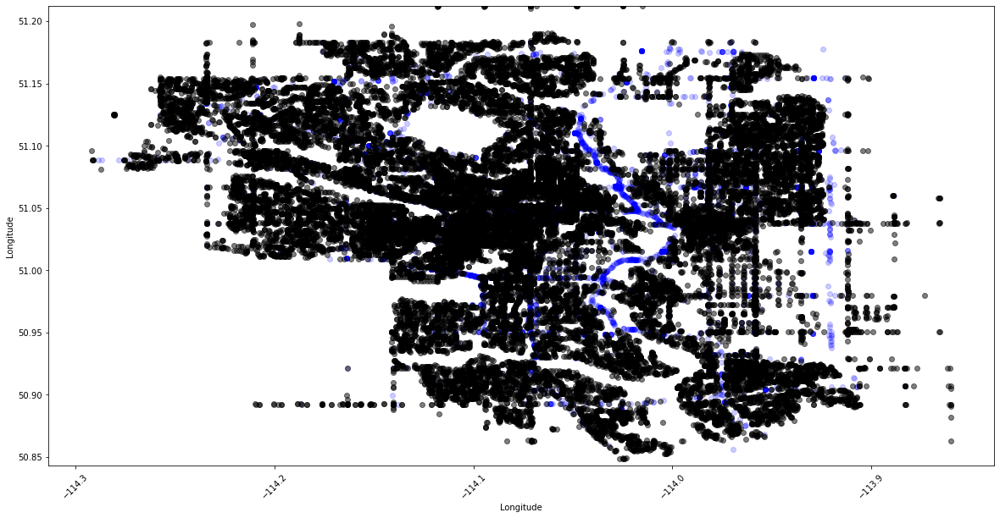

In [30]:
accidents = acc.extract_accidents('Data/Traffic_Incidents.csv', '2018')

plt.figure(figsize=(20,10))
plt.scatter(x = 'longitude', y = 'latitude', data = accidents, label = 'Accidents', c='b', alpha=0.2)
plt.scatter(x = 'longitude', y = 'latitude', data=df, label = 'Signs', c='k', alpha=0.5)
plt.ylim(50.842822, 51.212425)
plt.xticks(rotation=45)
plt.xlabel('Longitude')
plt.ylabel('Longitude')

## Grid Analysis

In [22]:
speed_grid = ga.populate_grid_ms(df,"SPEED")
speed_grid

C:\Users\Patrick\Desktop\ENSF592\Project_Phase_2_Git_2\ENSF592_YYC_Project\Phase II\Grid_Analysis.py:82: RuntimeWarning: invalid value encountered in true_divide
  grid = grid_sum / grid_count


array([[  0.        ,  84.        ,  61.42857143,   0.        ,
         80.        ,  80.        ,   0.        ,   0.        ,
          0.        ,   0.        ],
       [  0.        ,  72.        ,  64.61538462,  70.55555556,
         67.75      ,  67.69230769,  71.21212121,  74.        ,
         80.43478261,   0.        ],
       [ 80.        ,  64.44444444,  65.38461538,  69.41176471,
         57.2       ,  50.58823529,  51.9047619 ,  60.96774194,
         65.20833333,  65.        ],
       [ 73.33333333,  59.54545455,  59.04761905,  61.94444444,
         64.23076923,  58.        ,  60.34482759,  70.        ,
         65.83333333,  73.63636364],
       [ 60.        ,  59.66666667,  49.2       ,  60.86956522,
         53.88888889,  35.83333333,  59.        ,  71.08108108,
         61.11111111,  70.        ],
       [  0.        ,  60.        ,  58.23529412,  55.        ,
         50.        ,  51.66666667,  49.58333333,  75.        ,
         61.08695652,  60.        ],
       [  

In [23]:
#Maybe remove
print('{:.0f} speed limits that falls outside Calgary boundaries'.format(df.shape[0]-speed_grid.sum()))

-3198 speed limits that falls outside Calgary boundaries


In [28]:
ga.display_grid_on_map(speed_grid[::-1].ravel(), 'speed limit ')
type(speed_grid)

In [29]:
type(speed_grid)

numpy.ndarray

# Conclusions
There is no clear correlation between traffic camera location and the number of accidents. 